In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from matplotlib import rcParams
import lmfit
import matplotlib.image as mpimg
from PIL import Image
from pathlib import Path
from collections import OrderedDict
from lmfit.models import LorentzianModel

In [2]:
# bokeh packages
from bokeh.io import output_file,show,output_notebook,push_notebook, curdoc
from bokeh.plotting import figure
from bokeh.models import ColumnDataSource,HoverTool,CategoricalColorMapper, Select, Slider
from bokeh.palettes import Category10, Dark2, Set1
from bokeh.layouts import row,column,gridplot,widgetbox
from bokeh.models.widgets import Tabs,Panel
output_notebook()

Loading BokehJS ...

In [3]:
rcParams['font.family'] = 'sans-serif'
rcParams['font.sans-serif'] = ['Arial']
rcParams.update({'font.size': 22})
rcParams['xtick.direction'] = 'in'
rcParams['ytick.direction'] = 'in'
rcParams['xtick.top'] = True
rcParams['ytick.right'] = True
rcParams['xtick.major.size'] = 10
rcParams['ytick.major.size'] = 10
rcParams['xtick.minor.size'] = 5
rcParams['ytick.minor.size'] = 5
rcParams['xtick.minor.visible'] = True
rcParams['ytick.minor.visible'] = True

In [4]:
def read_data(filename):
    sample=np.genfromtxt(filename, delimiter='\t', skip_header=41)
    return sample

In [5]:
#selecting range 
def extract_peak(sample, xrange):
    idx = np.logical_and(xrange[0] < sample[:,0], sample[:,0] < xrange[1])
    return sample[idx,:]

In [6]:
#using bokeh to plot in tab
#making a dictionary for all sample in a same group with same angle i.e Ch1-5 with same angle
igor_files=Path.cwd()/'Gsaxs/polymer'
#igor_files=Path.cwd()
def igor_folder(name):
    group={}
    for file in igor_files.glob(name):
        sample=np.genfromtxt(file, delimiter='\t', skip_header=41)
        name1=file.name[1:7]
        name2=file.name[23:27]
        name=name1+name2
        group[name]=sample
    return OrderedDict(sorted(group.items()))

In [7]:
def tab_plot(data1): #angle1=data at angle 0 and so on
    data=[igor_folder(d) for d in data1]
    an=['angle=0','angle=0.05','angle=0.1','angle=0.15','angle=0.2']
    tabs=[]
    for angl, i in zip(data, range(7)):
        f=figure(y_axis_type="log", y_axis_label=' Intensity', x_axis_label='Qy')
        for k, color in zip(angl, Set1[7]):
            d=angl[k]
            x=d[:,2]
            y=d[:,4]
            f.line(x,y, color=color,line_width=2,legend_label=k, alpha=1,
                     hover_color='purple', hover_alpha=0.8)
        hover = HoverTool(tooltips=[ ('Q', '@x'), ('I', '@y')], mode='mouse')
        f.add_tools(hover)
        tab = Panel(child=f, title=an[i])
        tabs.append(tab)
    layout = Tabs(tabs=tabs)
    show(layout)

In [8]:
def tab_diff(p1, p3): #angle1=data at angle 0 and so on
    data1=[igor_folder(d) for d in p1]
    data3=[igor_folder(d) for d in p3]
    an=['angle=0','angle=0.05','angle=0.1','angle=0.15','angle=0.2']
    tabs=[]
    for angl1, angl3, i in zip(data1,data3, range(7)):
        f=figure(y_axis_label=' Intensity', x_axis_label='Qy')
        for k, j, color in zip(angl1, angl3, Set1[7]):
            d1=angl1[k]
            d3=angl3[j]
            x1=d1[:,2][:2010]; y1=d1[:,4][:2010]
            x3=d3[:,2][:2010]; y3=d3[:,4][:2010]
            y0=y3-y1
            f.line(x1,y0, color=color,line_width=2,legend_label='P3-P1-'+str(k[6:10]), alpha=1,
                     hover_color='purple', hover_alpha=0.8)
        hover = HoverTool(tooltips=[ ('Q', '@x'), ('I', '@y')], mode='mouse')
        f.add_tools(hover)
        tab = Panel(child=f, title=an[i])
        tabs.append(tab)
    layout = Tabs(tabs=tabs)
    show(layout)

In [9]:
P3=['SP3*_00_*.dat','SP3*_05_*.dat','SP3*_10_*.dat','SP3*_15_*.dat','SP3*_20_*.dat']
P1=['SP1*_00_*.dat','SP1*_05_*.dat','SP1*_10_*.dat','SP1*_15_*.dat','SP1*_20_*.dat']
tab_diff(p1=P1, p3=P3)


In [30]:
P3=['SP3_00_*0.04.dat','SP3_05_*0.04.dat','SP3*_10_*0.04.dat','SP3*_15_*0.04.dat','SP3*_20_*0.04.dat']
P1=['SP1_00_*0.04.dat','SP1_05_*0.04.dat','SP1*_10_*0.04.dat','SP1*_15_*0.04.dat','SP1*_20_*0.04.dat']
tab_diff(p1=P1, p3=P3)

In [10]:
def polymer_table(data1, xrange=[-0.2, 0.2]):
    data=[igor_folder(d) for d in data1]
    a=['angle=0','angle=0.05','angle=0.1','angle=0.15','angle=0.2']
    ang=[]; ks=[]
    for angl in data:
        for qz in angl:
            d = extract_peak(angl[qz],xrange)
            x=d[:,2][:590]  # y in columns 3
            y=d[:,4][:590]   # intensity in column 5
            ang.append(x)
            ks.append(qz)
    df=pd.DataFrame(ang,index=ks, columns=x)
    return df
            
            

In [11]:
P3=['S*3*_00_*0.05.dat','S*3*_05_*0.05.dat','S*3*_10_*0.05.dat','S*3*_15_*0.05.dat','S*3*_20_*0.05.dat']
polymer_table(P3)

,0.193569,0.192980,0.192392,0.191804,0.191216,0.190628,0.190040,0.189452,0.188864,0.188276,...,-0.166514,-0.167102,-0.167690,-0.168279,-0.168867,-0.169455,-0.170043,-0.170631,-0.171219,-0.171808
P3_00_0.05,0.193573,0.192985,0.192397,0.191809,0.191221,0.190633,0.190045,0.189457,0.188869,0.188280,...,-0.166518,-0.167106,-0.167695,-0.168283,-0.168871,-0.169459,-0.170047,-0.170636,-0.171224,-0.171812
P3_05_0.05,0.193572,0.192984,0.192396,0.191808,0.191220,0.190632,0.190044,0.189456,0.188868,0.188279,...,-0.166517,-0.167106,-0.167694,-0.168282,-0.168870,-0.169458,-0.170047,-0.170635,-0.171223,-0.171811
P3_10_0.05,0.193571,0.192983,0.192395,0.191807,0.191219,0.190631,0.190043,0.189455,0.188866,0.188278,...,-0.166516,-0.167105,-0.167693,-0.168281,-0.168869,-0.169457,-0.170046,-0.170634,-0.171222,-0.171810
P3_15_0.05,0.193570,0.192982,0.192394,0.191806,0.191218,0.190629,0.190041,0.189453,0.188865,0.188277,...,-0.166515,-0.167103,-0.167692,-0.168280,-0.168868,-0.169456,-0.170044,-0.170633,-0.171221,-0.171809
P3_20_0.05,0.193569,0.192980,0.192392,0.191804,0.191216,0.190628,0.190040,0.189452,0.188864,0.188276,...,-0.166514,-0.167102,-0.167690,-0.168279,-0.168867,-0.169455,-0.170043,-0.170631,-0.171219,-0.171808


In [33]:
P3=['S*3*_00_*.dat','S*3*_05_*.dat','S*3*_10_*.dat','S*3*_15_*.dat','S*3*_20_*.dat']
tab_plot(data1=P3)

In [17]:
P1=['S*1*_00_*.dat','S*1*_05_*.dat','S*1*_10_*.dat','S*1*_15_*.dat','S*1*_20_*.dat']
tab_plot(data1=P1)

In [43]:
P_0_01=['S*_00_*0.01.dat','SP*_05_*0.01.dat','SP*_10_*0.01.dat','SP*_15_*0.01.dat','SP*_20_*0.01.dat']
tab_plot(data1=P_0_01)

In [48]:
P_0_02=['S*_00_*0.02.dat','SP*_05_*0.02.dat','SP*_10_*0.02.dat','SP*_15_*0.02.dat','SP*_20_*0.02.dat']
tab_plot(data1=P_0_02)

In [17]:
P_0_03=['S*_00_*0.03.dat','SP*_05_*0.03.dat','SP*_10_*0.03.dat','SP*_15_*0.03.dat','SP*_20_*0.03.dat']
tab_plot(data1=P_0_03)

In [13]:
P_0_04=['S*_00_*0.04.dat','SP*_05_*0.04.dat','SP*_10_*0.04.dat','SP*_15_*0.04.dat','SP*_20_*0.04.dat']
tab_plot(data1=P_0_04)

In [16]:
P_0_05=['S*_00_*0.05.dat','SP*_05_*0.05.dat','SP*_10_*0.05.dat','SP*_15_*0.05.dat','SP*_20_*0.05.dat']
tab_plot(data1=P_0_05)

In [15]:
P_0_06=['S*_00_*0.06.dat','SP*_05_*0.06.dat','SP*_10_*0.06.dat','SP*_15_*0.06.dat','SP*_20_*0.06.dat']
tab_plot(data1=P_0_06)

In [16]:
P_0_08=['S*_00_*0.08.dat','SP*_05_*0.08.dat','SP*_10_*0.08.dat','SP*_15_*0.08.dat','SP*_20_*0.08.dat']
tab_plot(data1=P_0_08)

In [12]:
def tab_plot_sangle(data1): 
    data=[]
    for d in data1:
        angle= igor_folder(d)
        data.append(angle)
    
    an=['0.01','0.02','0.03','0.04','0.05', '0.06', '0.08']
    tabs=[]
    for angl, i in zip(data, range(8)):
        f=figure(y_axis_type="log", y_axis_label=' Intensity', x_axis_label='Qy')
        for k, color in zip(angl,Category10[10]):
            d=angl[k]
            x=d[:,2]
            y=d[:,4]
            f.line(x,y, color=color,line_width=2,legend_label=k, alpha=1,
                     hover_color='purple', hover_alpha=0.8)
        hover = HoverTool(tooltips=[ ('Q', '@x'), ('I', '@y')], mode='mouse')
        f.add_tools(hover)
        tab = Panel(child=f, title=an[i])
        tabs.append(tab)
    layout = Tabs(tabs=tabs)
    show(layout)

In [13]:
def tab_diff_sangle(p1, p3): #angle1=data at angle 0 and so on
    data1=[igor_folder(d) for d in p1]
    data3=[igor_folder(d) for d in p3]
    an=['0.01','0.02','0.03','0.04','0.05', '0.06', '0.08']
    tabs=[]
    for angl1, angl3, i in zip(data1,data3, range(8)):
        f=figure(y_axis_label=' Intensity', x_axis_label='Qy')
        for k, j, color in zip(angl1, angl3, Set1[8]):
            d1=angl1[k]
            d3=angl3[j]
            x1=d1[:,2][:2010]; y1=d1[:,4][:2010]
            x3=d3[:,2][:2010]; y3=d3[:,4][:2010]
            y0=y3-y1
            f.line(x1,y0, color=color,line_width=2,legend_label='P3-P1-'+str(k[3:5]), alpha=1,
                     hover_color='purple', hover_alpha=0.8)
        hover = HoverTool(tooltips=[ ('Q', '@x'), ('I', '@y')], mode='mouse')
        f.add_tools(hover)
        tab = Panel(child=f, title=an[i])
        tabs.append(tab)
    layout = Tabs(tabs=tabs)
    show(layout)

In [14]:
p_3=['SP3*0.01.dat','SP3*0.02.dat','SP3*0.03.dat','SP3*0.04.dat',
      'SP3*0.05.dat','SP3*0.06.dat','SP3*0.08.dat']
p_1=['SP1*0.01.dat','SP1*0.02.dat','SP1*0.03.dat','SP1*0.04.dat',
      'SP1*0.05.dat','SP1*0.06.dat','SP1*0.08.dat']
tab_diff_sangle(p1=p_1, p3=p_3)

In [49]:
p_3=['SP3_10_*0.01.dat','SP3_10_*0.02.dat','SP3_10_*0.03.dat','SP3_10_*0.04.dat',
      'SP3_10_*0.05.dat','SP3_10_*0.06.dat','SP3_10_*0.08.dat']
p_1=['SP1_10_*0.01.dat','SP1_10_*0.02.dat','SP1_10_*0.03.dat','SP1_10_*0.04.dat',
      'SP1_10_*0.05.dat','SP1_10_*0.06.dat','SP1_10_*0.08.dat']
tab_diff_sangle(p1=p_1, p3=p_3)

In [38]:
P0=['SP3*0.01.dat','SP3*0.02.dat','SP3*0.03.dat','SP3*0.04.dat',
      'SP3*0.05.dat','SP3*0.06.dat','SP3*0.08.dat']
tab_plot_sangle(data1=P0)

In [42]:
P1=['SP1*_00_*.dat','SP1*_05_*.dat','SP1*_10_*.dat','SP1*_20_*.dat']
tab_plot_sangle(data1=P1)

In [41]:
P_00=['S*_00_*0.01.dat','S*_00_*0.02.dat','S*_00_*0.03.dat','S*_00_*0.04.dat',
      'S*_00_*0.05.dat','S*_00_*0.06.dat','S*_00_*0.08.dat']
tab_plot_sangle(data1=P_00)

In [48]:
P_05=['S*_05_*0.01.dat','S*_05_*0.02.dat','S*_05_*0.03.dat','S*_05_*0.04.dat',
      'S*_05_*0.05.dat','S*_05_*0.06.dat','S*_05_*0.08.dat']
tab_plot_sangle(data1=P_05)

In [10]:
P_10=['S*_10_*0.01.dat','S*_10_*0.02.dat','S*_10_*0.03.dat','S*_10_*0.04.dat',
      'S*_10_*0.05.dat','S*_10_*0.06.dat','S*_10_*0.08.dat']
tab_plot_sangle(data1=P_10)

In [11]:
P_15=['S*_15_*0.01.dat','S*_15_*0.02.dat','S*_15_*0.03.dat','S*_15_*0.04.dat',
      'S*_15_*0.05.dat','S*_15_*0.06.dat','S*_15_*0.08.dat']
tab_plot_sangle(data1=P_00)

In [12]:
P_20=['S*_20_*0.01.dat','S*_20_*0.02.dat','S*_20_*0.03.dat','S*_20_*0.04.dat',
      'S*_20_*0.05.dat','S*_20_*0.06.dat','S*_20_*0.08.dat']
tab_plot_sangle(data1=P_20)

In [50]:
#to import multiple figures
# single figures without averaging
igor_2dfig=Path.cwd()/'igor_new'

        
def process1(filename: str=None) -> None:
    """
    View multiple images stored in files, stacking vertically

    Arguments:
        filename: str - path to filename containing image
    """
    image = Image.open(filename)    #from PIL import Image
    #image = mpimg.imread(filename)
    #plt.figure()
    #plt.imshow(image1)
    display(image)

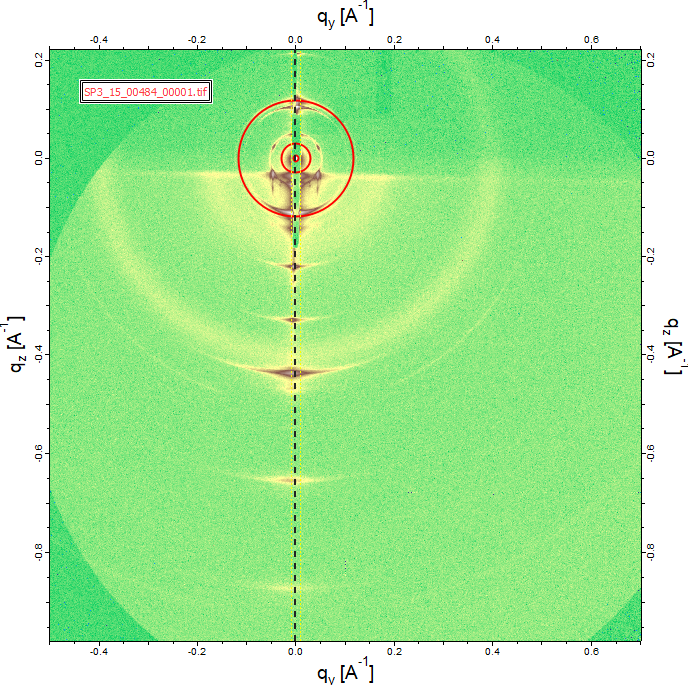

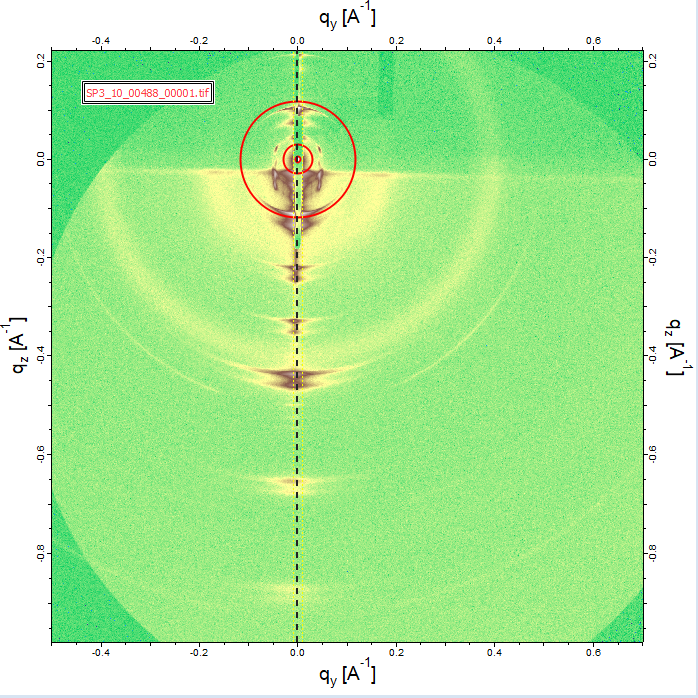

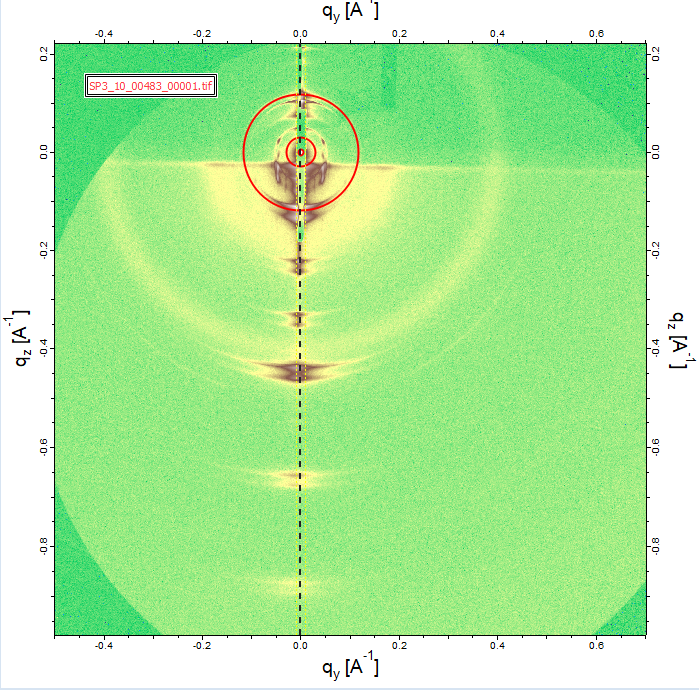

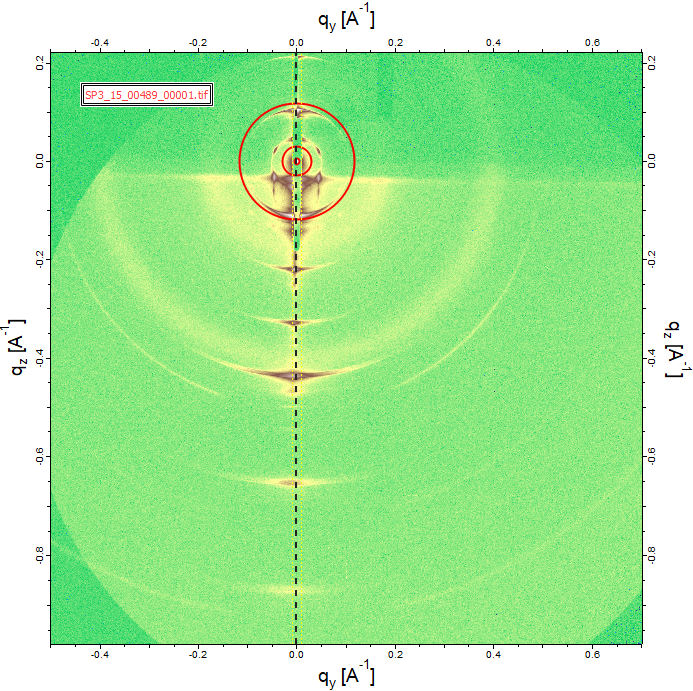

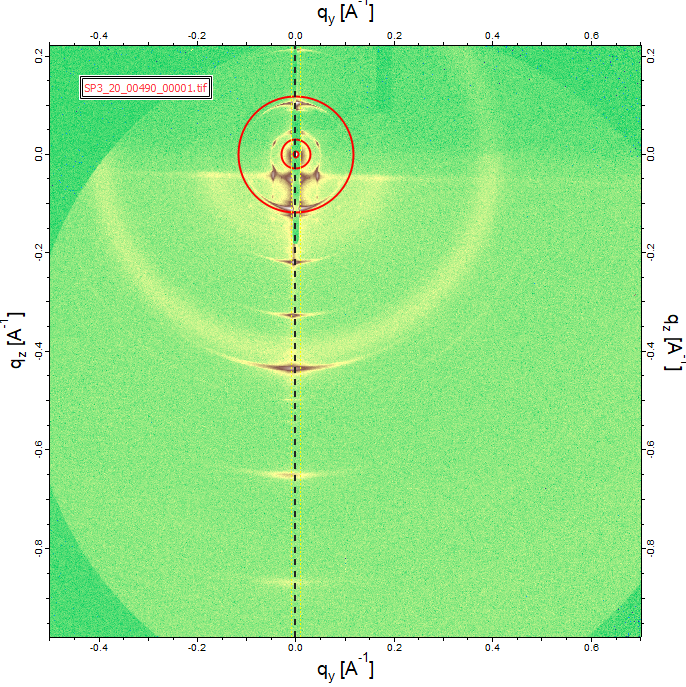

In [52]:
for file in igor_2dfig.glob('P3*.png'):
    process1(file)